## Seismic Event Detection and Analysis using Short-Time Fourier Transform

## 191180005 - Selin Cansu Akbaş

In [86]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import detrend

# gdown ile dosyayı indirme
import gdown

In [9]:
# Dosya kimliğini girin
file_id = '1-q13K3ClUFu8nPqRFSNpBVmjeZLAg2Ju'

In [11]:
# Gdown URL'si oluşturun
gdown_url = f'https://drive.google.com/uc?id={file_id}'

In [13]:
# Dosyayı indirin
output = 'seismicdata.csv'
gdown.download(gdown_url, output, quiet=False)

Downloading...
From (original): https://drive.google.com/uc?id=1-q13K3ClUFu8nPqRFSNpBVmjeZLAg2Ju
From (redirected): https://drive.google.com/uc?id=1-q13K3ClUFu8nPqRFSNpBVmjeZLAg2Ju&confirm=t&uuid=e39d5f64-6826-4ba9-9957-d13559cf0a33
To: /Users/selincansuakbas/seismicdata.csv
100%|████████████████████████████████████████| 495M/495M [01:10<00:00, 7.06MB/s]


'seismicdata.csv'

In [15]:
# Veri yükleme
df = pd.read_csv('seismicdata.csv')

In [17]:
df.head()

,time,place,status,tsunami,significance,data_type,magnitudo,state,longitude,latitude,depth,date
0,631153353990,"12 km NNW of Meadow Lakes, Alaska",reviewed,0,96,earthquake,2.50,Alaska,-149.669200,61.730200,30.100,1990-01-01 00:22:33.990000+00:00
1,631153491210,"14 km S of Volcano, Hawaii",reviewed,0,31,earthquake,1.41,Hawaii,-155.212333,19.317667,6.585,1990-01-01 00:24:51.210000+00:00
2,631154083450,"7 km W of Cobb, California",reviewed,0,19,earthquake,1.11,California,-122.806167,38.821000,3.220,1990-01-01 00:34:43.450000+00:00
3,631155512130,"11 km E of Mammoth Lakes, California",reviewed,0,15,earthquake,0.98,California,-118.846333,37.664333,-0.584,1990-01-01 00:58:32.130000+00:00
4,631155824490,"16km N of Fillmore, CA",reviewed,0,134,earthquake,2.95,California,-118.934000,34.546000,16.122,1990-01-01 01:03:44.490000+00:00


In [19]:
# Zaman sütununu datetime formatına çevirme
df['time'] = pd.to_datetime(df['time'])

In [21]:
# Zaman serisi verilerini ayıklama
data = df[['time', 'magnitudo']].set_index('time')

In [23]:
# Eksik değerlerin kontrolü ve işlenmesi
print(f"Eksik değerler:\n{data.isnull().sum()}")

Eksik değerler:
magnitudo    0
dtype: int64


In [25]:
# Eksik değerlerin interpolasyon ile doldurulması
data['magnitudo'].interpolate(method='time', inplace=True)

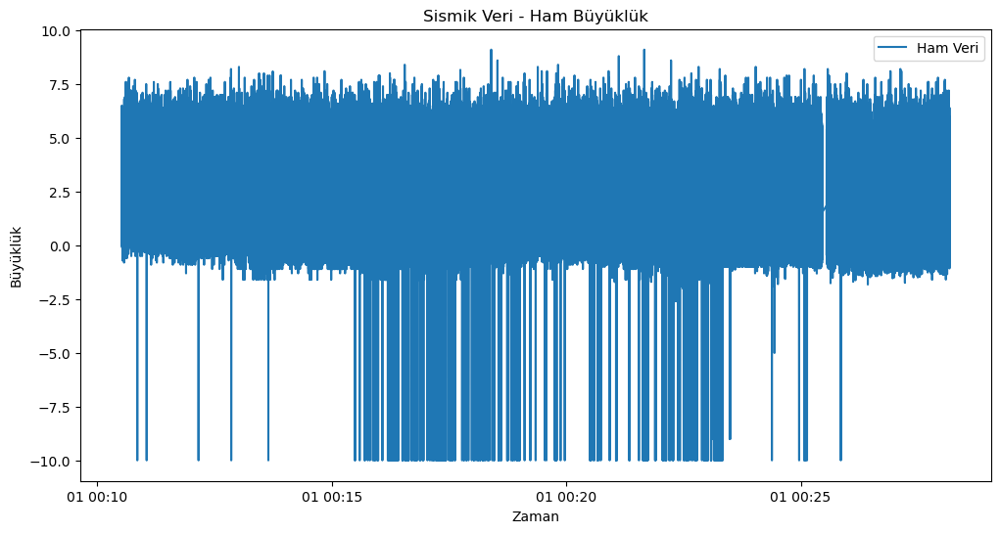

In [27]:
# Ham verilerin görselleştirilmesi
plt.figure(figsize=(12, 6))
plt.plot(data.index, data['magnitudo'], label='Ham Veri')
plt.xlabel('Zaman')
plt.ylabel('Büyüklük')
plt.title('Sismik Veri - Ham Büyüklük')
plt.legend()
plt.show()

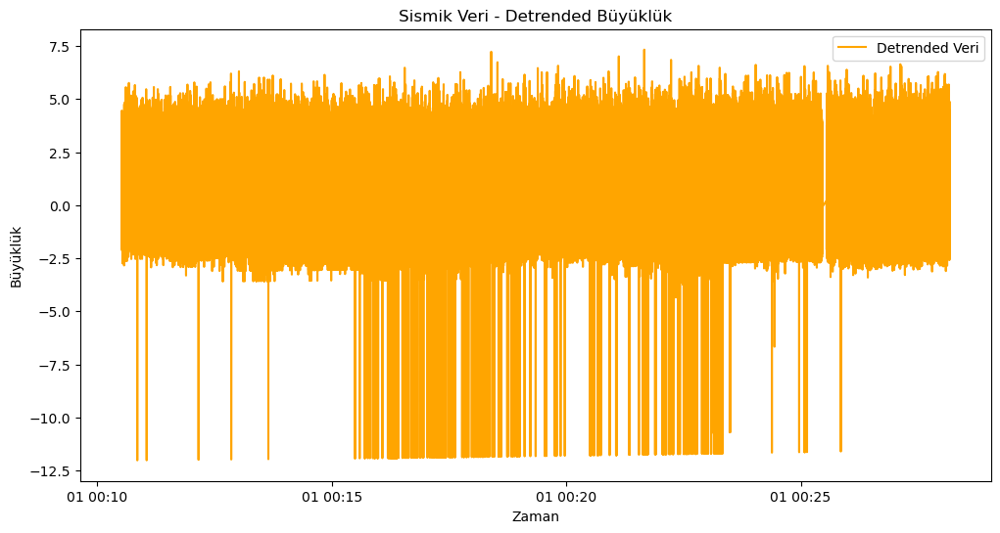

In [29]:
# Ön işleme: Detrend (trend çıkarma) ve gürültü giderme
data['detrended_magnitude'] = detrend(data['magnitudo'])

plt.figure(figsize=(12, 6))
plt.plot(data.index, data['detrended_magnitude'], label='Detrended Veri', color='orange')
plt.xlabel('Zaman')
plt.ylabel('Büyüklük')
plt.title('Sismik Veri - Detrended Büyüklük')
plt.legend()
plt.show()

In [31]:
from scipy.signal import stft

# STFT parametrelerini yeniden belirleme
fs = 1  # Örnekleme frekansı (1 Hz varsayılmıştır)
nperseg_list = [128, 256, 512]  # Farklı pencere boyutları

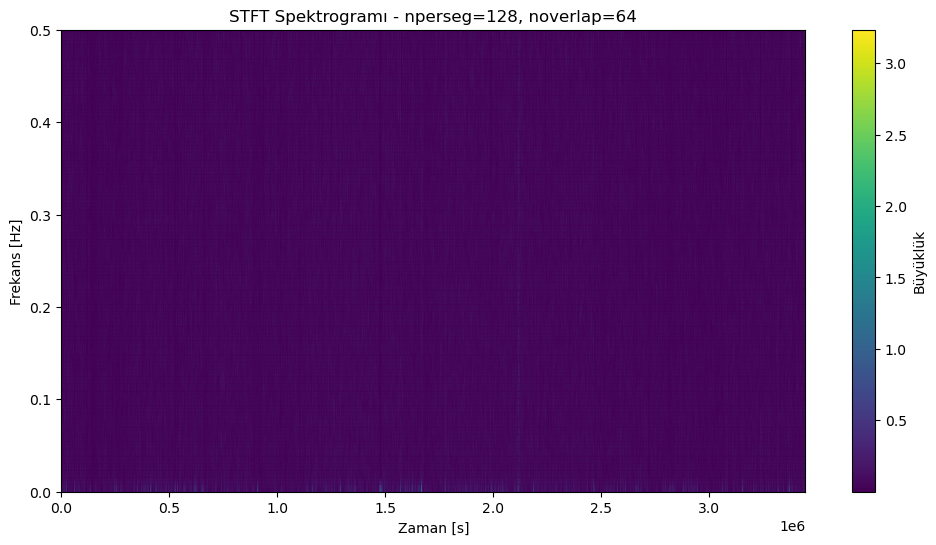

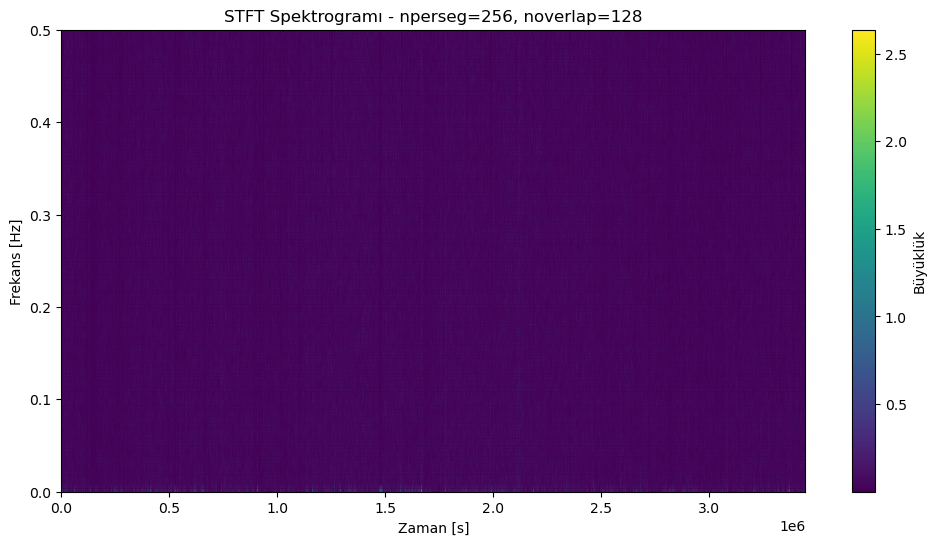

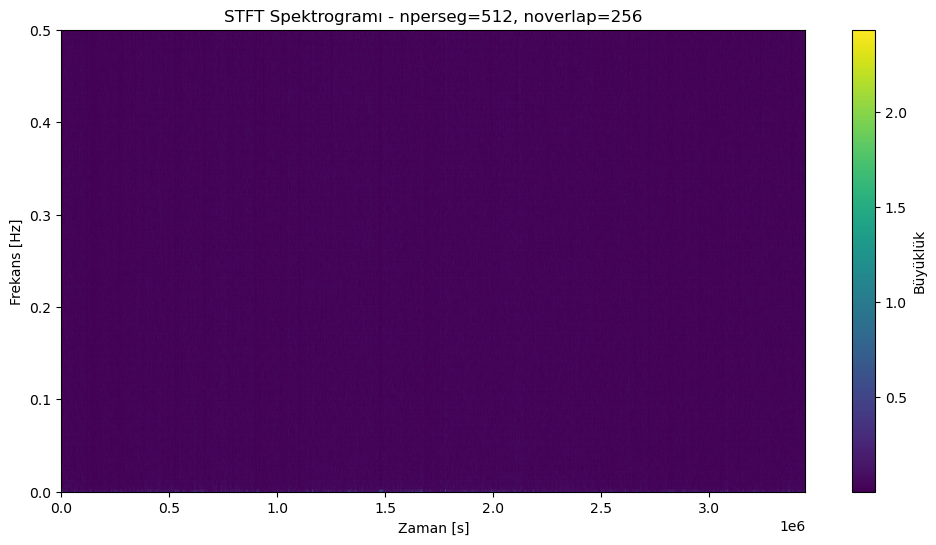

In [33]:
for nperseg in nperseg_list:
    noverlap = nperseg // 2  # Pencere boyutunun yarısı kadar örtüşme kullanıyoruz
    f, t, Zxx = stft(data['detrended_magnitude'], fs=fs, nperseg=nperseg, noverlap=noverlap)
    
    # STFT spektrogramının görselleştirilmesi
    plt.figure(figsize=(12, 6))
    plt.pcolormesh(t, f, np.abs(Zxx), shading='gouraud', cmap='viridis')  # Renk haritasını değiştiriyoruz
    plt.colorbar(label='Büyüklük')
    plt.title(f'STFT Spektrogramı - nperseg={nperseg}, noverlap={noverlap}')
    plt.xlabel('Zaman [s]')
    plt.ylabel('Frekans [Hz]')
    plt.show()

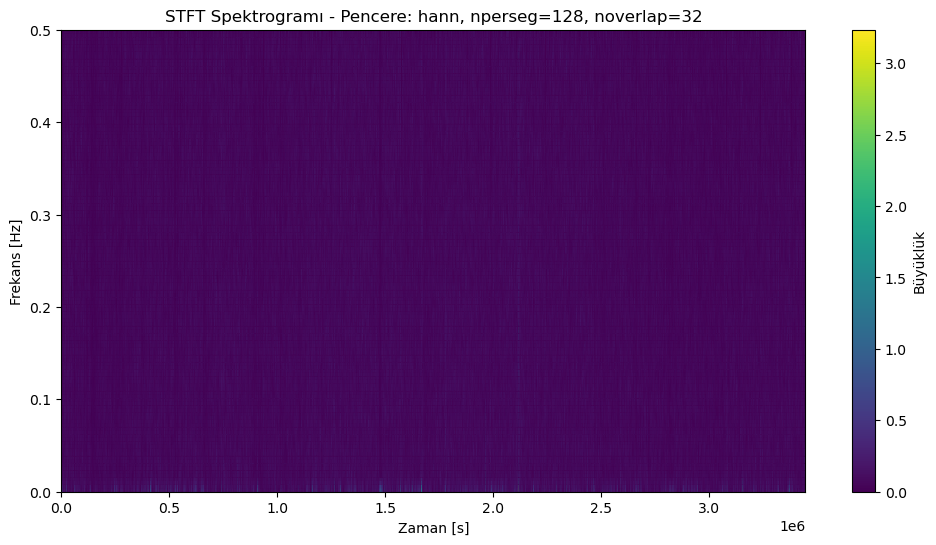

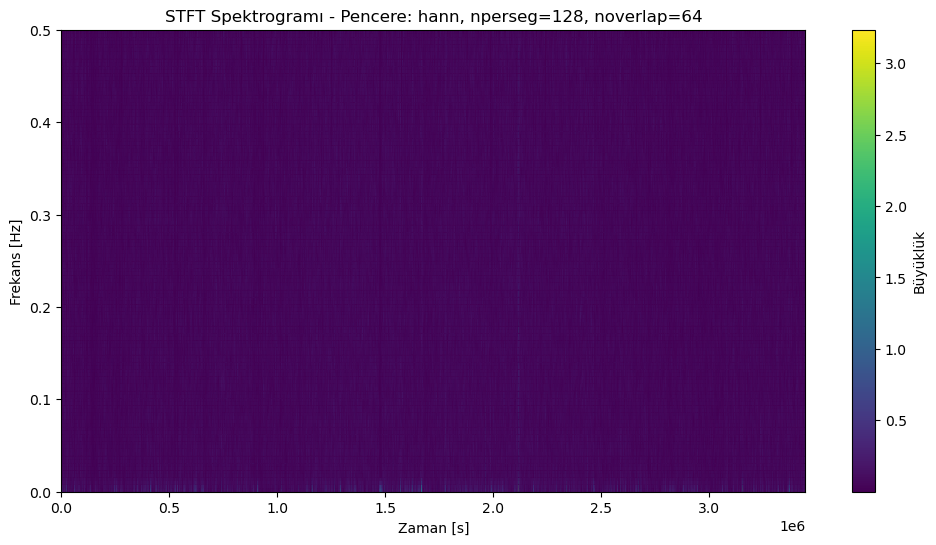

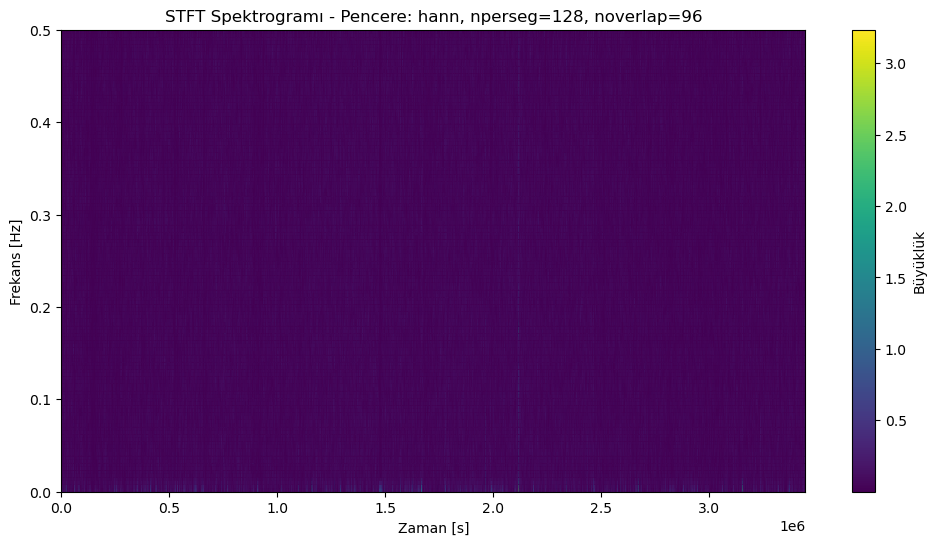

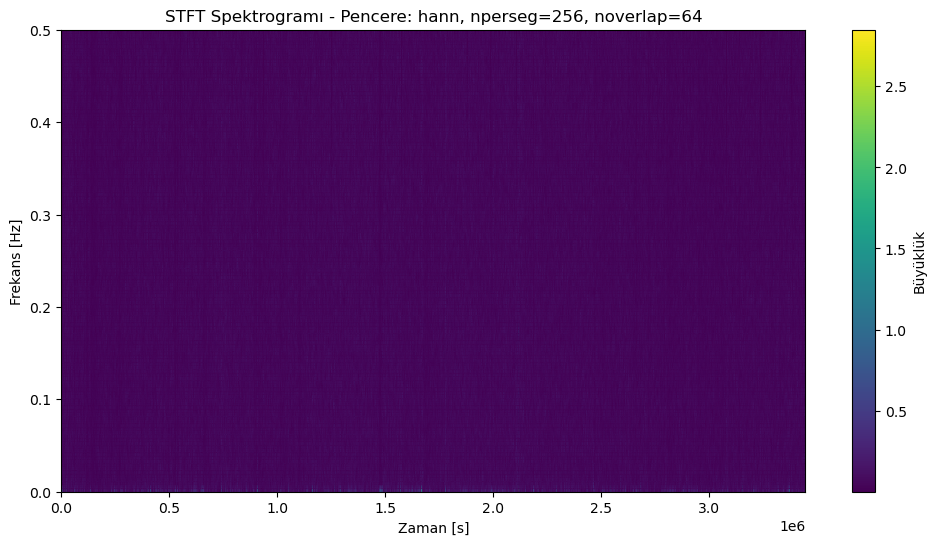

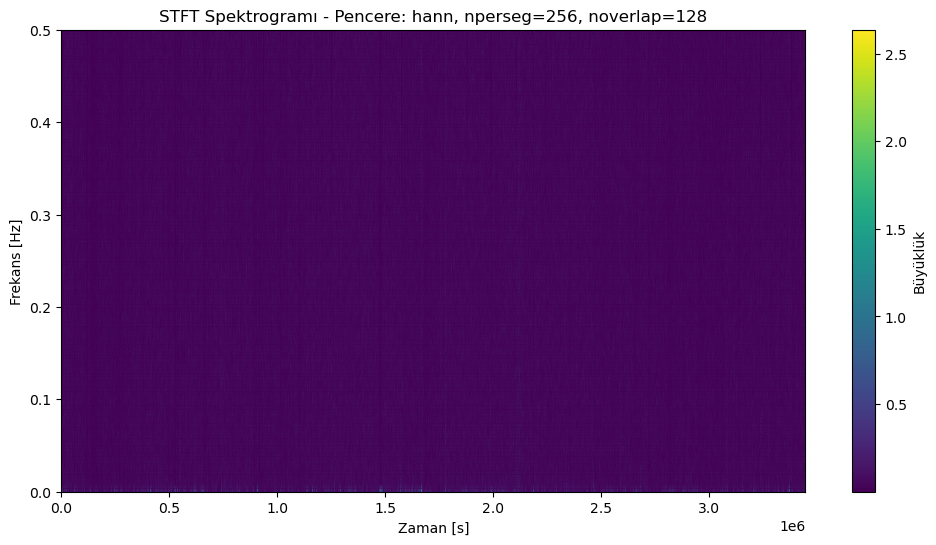

...

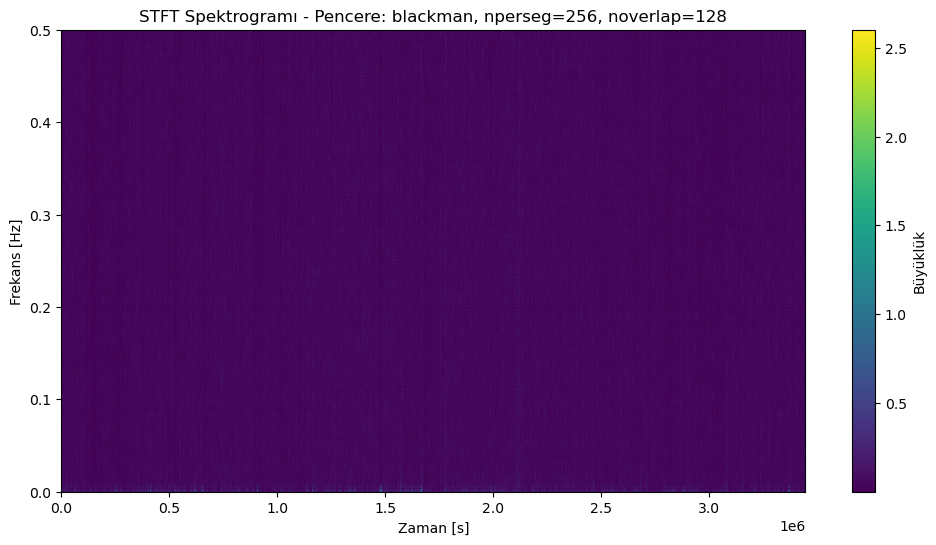

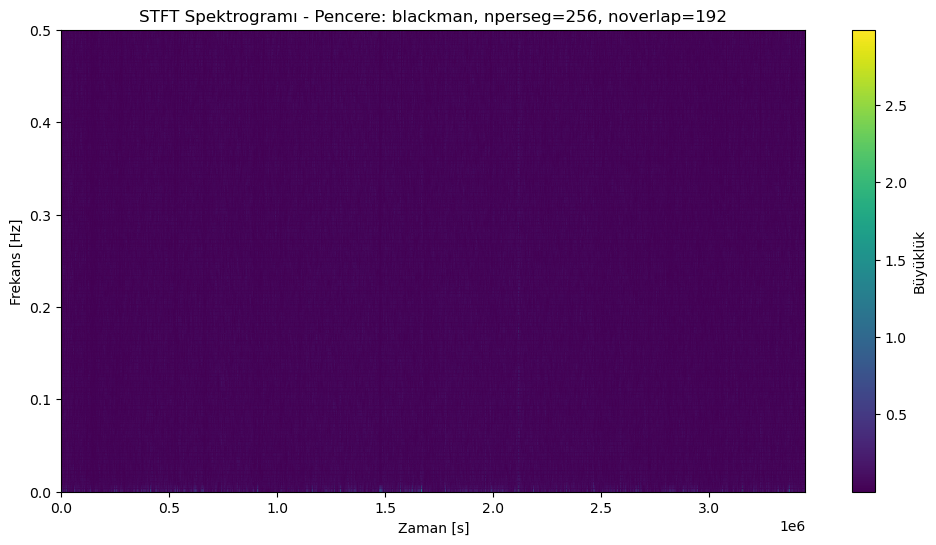

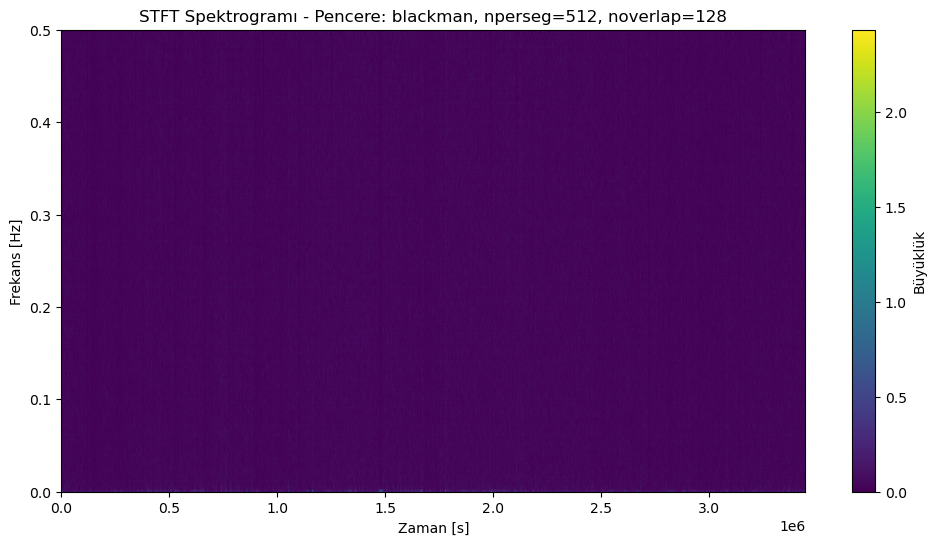

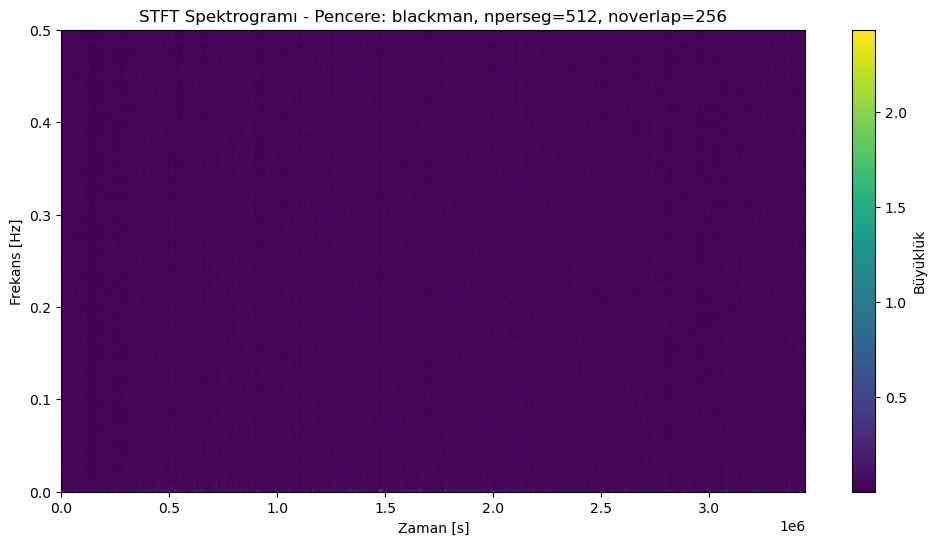

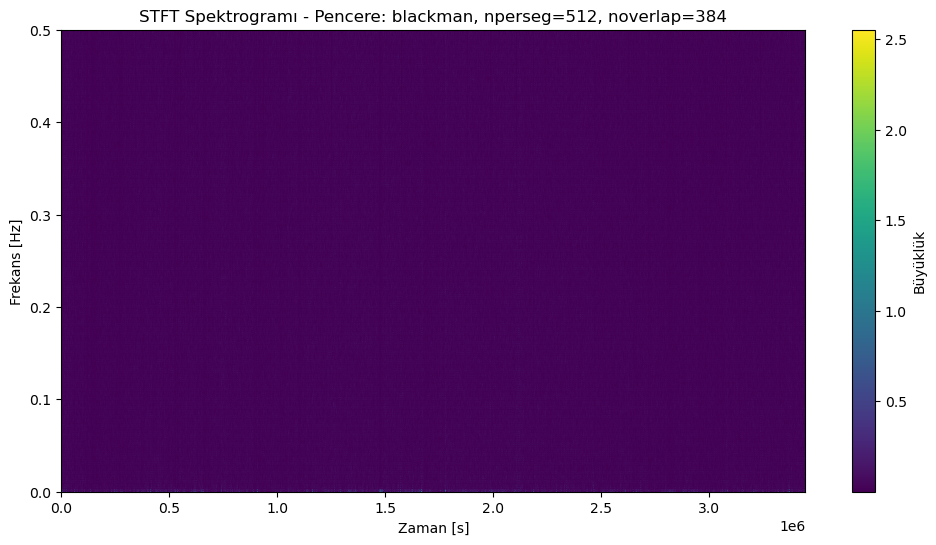

In [35]:
from scipy.signal import stft, get_window
# STFT parametrelerini optimize etme
fs = 1  # Örnekleme frekansı (1 Hz varsayılmıştır)
window_functions = ['hann', 'hamming', 'blackman']
nperseg_list = [128, 256, 512]  # Farklı pencere boyutları
overlap_ratios = [0.25, 0.5, 0.75]  # Farklı örtüşme oranları

# Parametrelerin kombinasyonlarını test etme
for window_function in window_functions:
    for nperseg in nperseg_list:
        for overlap_ratio in overlap_ratios:
            noverlap = int(nperseg * overlap_ratio)
            window = get_window(window_function, nperseg)
            f, t, Zxx = stft(data['detrended_magnitude'], fs=fs, window=window, nperseg=nperseg, noverlap=noverlap)
            
            # STFT spektrogramının görselleştirilmesi
            plt.figure(figsize=(12, 6))
            plt.pcolormesh(t, f, np.abs(Zxx), shading='gouraud', cmap='viridis')
            plt.colorbar(label='Büyüklük')
            plt.title(f'STFT Spektrogramı - Pencere: {window_function}, nperseg={nperseg}, noverlap={noverlap}')
            plt.xlabel('Zaman [s]')
            plt.ylabel('Frekans [Hz]')
            plt.show()

In [36]:
from sklearn.model_selection import ParameterGrid

# Parametre gridini oluşturma
param_grid = {
    'window': ['hann', 'hamming', 'blackman'],
    'nperseg': [128, 256, 512],
    'overlap_ratio': [0.25, 0.5, 0.75]
}

best_score = -np.inf
best_params = None

# Parametre kombinasyonlarını test etme
for params in ParameterGrid(param_grid):
    noverlap = int(params['nperseg'] * params['overlap_ratio'])
    window = get_window(params['window'], params['nperseg'])
    f, t, Zxx = stft(data['detrended_magnitude'], fs=fs, window=window, nperseg=params['nperseg'], noverlap=noverlap)
    
    # STFT sonuçlarının değerlendirilmesi (örnek olarak spektral enerji kullanıldı)
    score = np.sum(np.abs(Zxx)**2)
    
    if score > best_score:
        best_score = score
        best_params = params

print(f"En iyi parametreler: {best_params}")


En iyi parametreler: {'nperseg': 128, 'overlap_ratio': 0.75, 'window': 'blackman'}


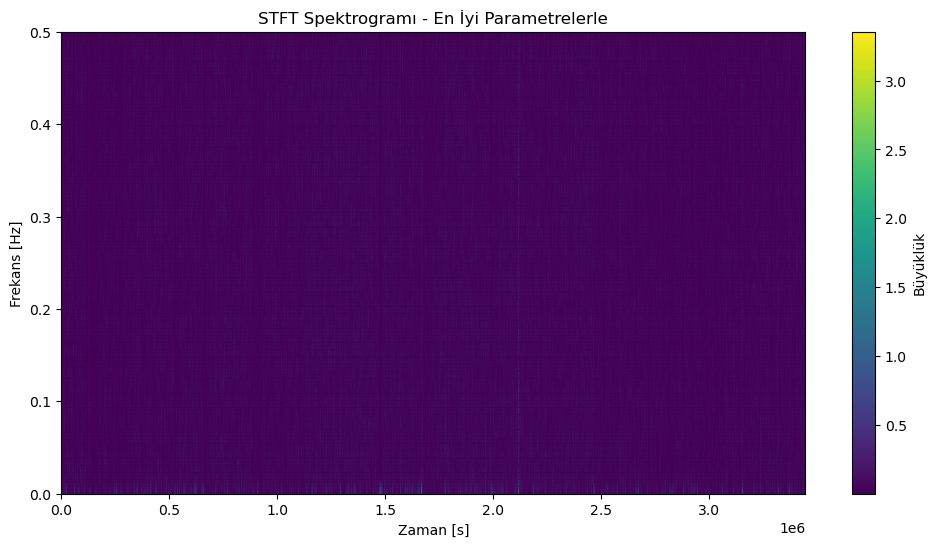

In [39]:
# En iyi parametrelerle STFT uygulama
noverlap = int(best_params['nperseg'] * best_params['overlap_ratio'])
window = get_window(best_params['window'], best_params['nperseg'])
f, t, Zxx = stft(data['detrended_magnitude'], fs=fs, window=window, nperseg=best_params['nperseg'], noverlap=noverlap)

# STFT spektrogramının görselleştirilmesi
plt.figure(figsize=(12, 6))
plt.pcolormesh(t, f, np.abs(Zxx), shading='gouraud', cmap='viridis')
plt.colorbar(label='Büyüklük')
plt.title(f'STFT Spektrogramı - En İyi Parametrelerle')
plt.xlabel('Zaman [s]')
plt.ylabel('Frekans [Hz]')
plt.show()

In [41]:
# STFT spektrogramlarını eğitim ve test verilerine dönüştürme
spectrograms = np.abs(Zxx).T
labels = (np.max(spectrograms, axis=1) > np.percentile(spectrograms, 95)).astype(int)  # Eşik değeriyle etiketleme

In [43]:
from sklearn.model_selection import train_test_split
# Eğitim ve test setlerine ayırma
X_train, X_test, y_train, y_test = train_test_split(spectrograms, labels, test_size=0.2, random_state=42)

In [45]:
# CNN modeli için veriyi 4 boyutlu hale getirme (örnek sayısı, yükseklik, genişlik, kanal sayısı)
X_train = X_train[..., np.newaxis]
X_test = X_test[..., np.newaxis]

In [47]:
print(f'X_train shape: {X_train.shape}')
print(f'X_test shape: {X_test.shape}')

X_train shape: (86144, 65, 1)
X_test shape: (21537, 65, 1)


In [49]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, Flatten, Dense, Dropout
# CNN modelini oluşturma
model = Sequential([
    Input(shape=(X_train.shape[1], X_train.shape[2], 1)),
    Conv2D(32, (3, 1), activation='relu'),
    MaxPooling2D((2, 1)),
    Dropout(0.25),
    Conv2D(64, (3, 1), activation='relu'),
    MaxPooling2D((2, 1)),
    Dropout(0.25),
    Conv2D(128, (3, 1), activation='relu'),
    MaxPooling2D((2, 1)),
    Dropout(0.25),
    Flatten(),
    Dense(128, activation='relu'),
    Dropout(0.5),
    Dense(1, activation='sigmoid')
])

In [51]:
# Modeli derleme
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

In [53]:
# Modeli eğitme
history = model.fit(X_train, y_train, epochs=20, batch_size=32, validation_data=(X_test, y_test))

Epoch 1/20
2692/2692 ━━━━━━━━━━━━━━━━━━━━ 7s 2ms/step - accuracy: 0.9085 - loss: 0.2117 - val_accuracy: 0.9712 - val_loss: 0.0763
Epoch 2/20
2692/2692 ━━━━━━━━━━━━━━━━━━━━ 6s 2ms/step - accuracy: 0.9680 - loss: 0.0869 - val_accuracy: 0.9822 - val_loss: 0.0654
Epoch 3/20
2692/2692 ━━━━━━━━━━━━━━━━━━━━ 6s 2ms/step - accuracy: 0.9714 - loss: 0.0804 - val_accuracy: 0.9708 - val_loss: 0.0685
Epoch 4/20
2692/2692 ━━━━━━━━━━━━━━━━━━━━ 6s 2ms/step - accuracy: 0.9724 - loss: 0.0774 - val_accuracy: 0.9842 - val_loss: 0.0581
Epoch 5/20
2692/2692 ━━━━━━━━━━━━━━━━━━━━ 6s 2ms/step - accuracy: 0.9720 - loss: 0.0776 - val_accuracy: 0.9787 - val_loss: 0.0662
Epoch 6/20
2692/2692 ━━━━━━━━━━━━━━━━━━━━ 6s 2ms/step - accuracy: 0.9712 - loss: 0.0808 - val_accuracy: 0.9687 - val_loss: 0.0724
Epoch 7/20
2692/2692 ━━━━━━━━━━━━━━━━━━━━ 6s 2ms/step - accuracy: 0.9742 - loss: 0.0735 - val_accuracy: 0.9675 - val_loss: 0.0753
Epoch 8/20
2692/2692 ━━━━━━━━━━━━━━━━━━━━ 6s 2ms/step - accuracy: 0.9739 - loss: 0.0738 - 

In [55]:
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
import seaborn as sns

# Modelin performansını değerlendirme
y_pred = (model.predict(X_test) > 0.5).astype("int32")

674/674 ━━━━━━━━━━━━━━━━━━━━ 0s 484us/step


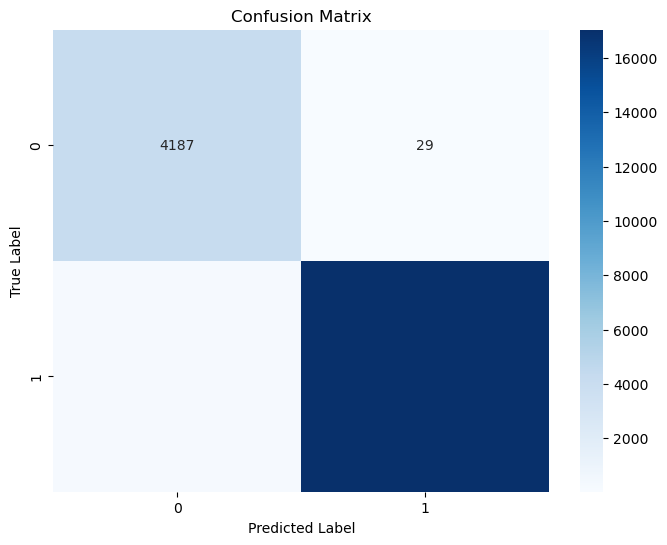

In [57]:
# Karışıklık matrisi
conf_matrix = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap='Blues')
plt.title('Confusion Matrix')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

In [59]:
# Sınıflandırma raporu
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.94      0.99      0.96      4216
           1       1.00      0.98      0.99     17321

    accuracy                           0.99     21537
   macro avg       0.97      0.99      0.98     21537
weighted avg       0.99      0.99      0.99     21537



In [61]:
# ROC eğrisi ve AUC skoru
fpr, tpr, _ = roc_curve(y_test, model.predict(X_test))
roc_auc = auc(fpr, tpr)

674/674 ━━━━━━━━━━━━━━━━━━━━ 0s 519us/step


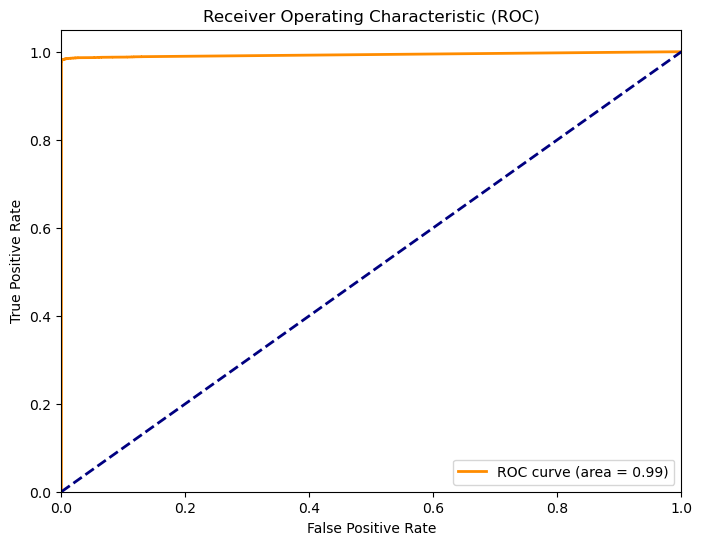

In [63]:
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (area = {roc_auc:0.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC)')
plt.legend(loc="lower right")
plt.show()

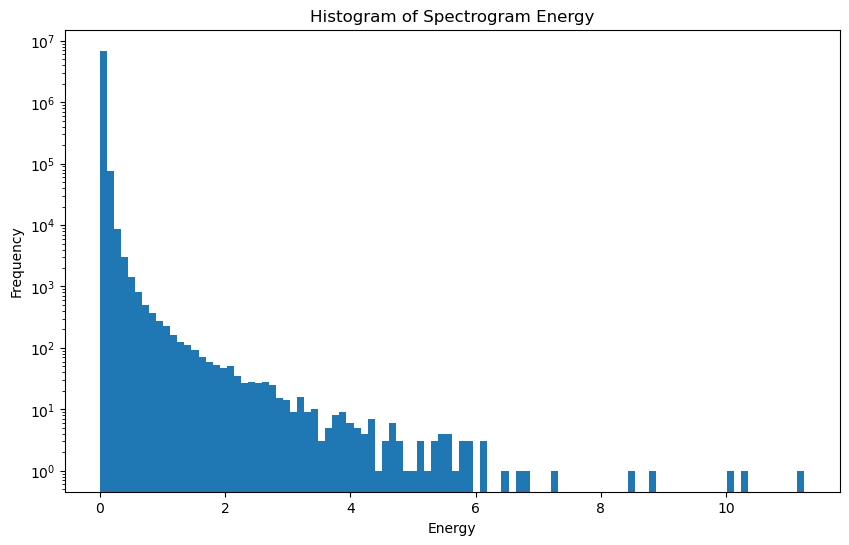

In [65]:
# Spektrogramın enerjisini hesaplama
spectrogram_energy = np.abs(Zxx)**2

# Enerji histogramı
plt.figure(figsize=(10, 6))
plt.hist(spectrogram_energy.flatten(), bins=100, log=True)
plt.xlabel('Energy')
plt.ylabel('Frequency')
plt.title('Histogram of Spectrogram Energy')
plt.show()

In [67]:
# Eşik değerini belirleme (histogramın üst yüzde 5'ine göre)
threshold = np.percentile(spectrogram_energy, 95)
print(f"Eşik değeri: {threshold}")

Eşik değeri: 0.06960081530020702


In [69]:
# Eşik değerine göre önemli enerji değişikliklerini tespit etme
significant_changes = spectrogram_energy > threshold

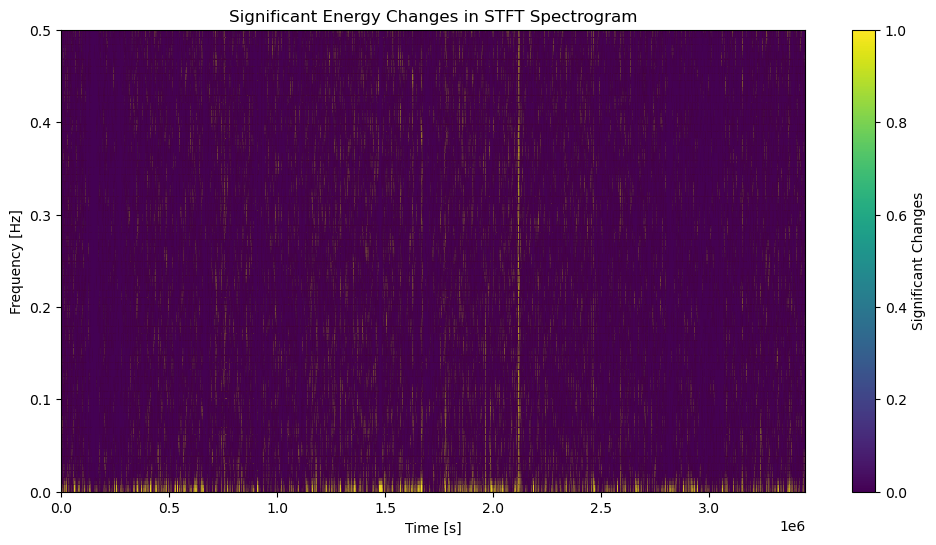

In [71]:
# Önemli enerji değişikliklerini görselleştirme
plt.figure(figsize=(12, 6))
plt.pcolormesh(t, f, significant_changes, shading='gouraud', cmap='viridis')
plt.colorbar(label='Significant Changes')
plt.title('Significant Energy Changes in STFT Spectrogram')
plt.xlabel('Time [s]')
plt.ylabel('Frequency [Hz]')
plt.show()

Text(0.5, 1.0, 'Model Accuracy')

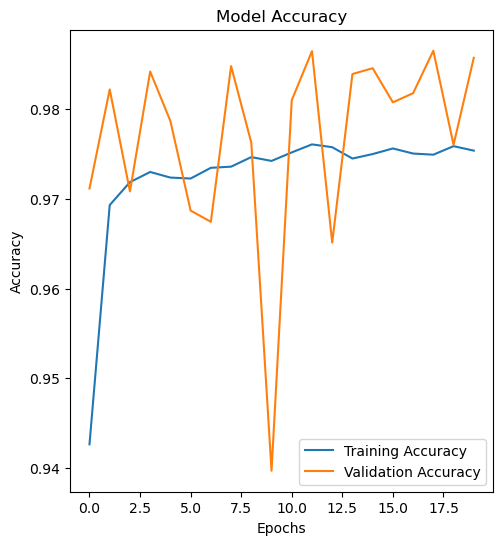

In [73]:
# Eğitim sürecindeki doğruluk ve kayıp değerlerinin görselleştirilmesi
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.title('Model Accuracy')

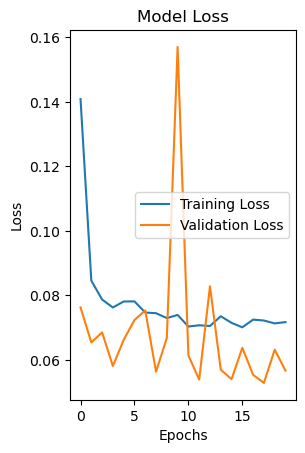

In [75]:
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title('Model Loss')

plt.show()